In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from datetime import timedelta

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [14, 8]

import seaborn as sb

1. Preprocesamiento de los datos recopilados de Teledyne en Arequipa solo se considera a partir del 23 de Enero 00:00 hasta el 8 de Marzo 15:15 con una frecuencia de 15 minutos.

In [ ]:
df_teledyne = pd.read_csv('PUCP.txt',sep=',')

<ipython-input-7-c78f5e9a8a5c>:1: DtypeWarning: Columns (7,8,9,10) have mixed types. Specify dtype option on import or set low_memory=False.
  df_teledyne = pd.read_csv('PUCP.txt',sep=',')


In [ ]:
df_teledyne.head()

,Date & Time (Local),Date & Time (UTC),Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 1Hr Avg,PM10 Conc,PM10STP Conc,PM2.5 Conc,PM2.5STP Conc
0,12/17/2023 10:52:00 PM,12/18/2023 3:52:00 AM,99.110046,20.797447,30.318817,41.192352,21.5379536,20.839817,21.0043755127216,9.240932,9.31390164393122
1,12/17/2023 10:53:00 PM,12/18/2023 3:53:00 AM,99.114288,20.751007,30.242126,41.168282,21.451296725,20.542853,20.7012043111805,9.167708,9.23837581728517
2,12/17/2023 10:54:00 PM,12/18/2023 3:54:00 AM,99.115578,20.808531,30.223175,41.188934,21.35792765,20.179784,20.3417829001133,9.152453,9.22592689443507
3,12/17/2023 10:55:00 PM,12/18/2023 3:55:00 AM,99.114372,20.767599,30.292664,41.196541,21.278949125,20.272331,20.4308003746561,9.213473,9.28549497442026
4,12/17/2023 10:56:00 PM,12/18/2023 3:56:00 AM,99.104340,20.750751,30.251862,41.207794,21.183757925,20.348606,20.5074721526181,9.108722,9.17983584531246


In [ ]:
df_teledyne.dtypes

Date & Time (Local)     object
 Date & Time (UTC)      object
 Ambient Pressure      float64
 Ambient Temp          float64
 Box Temp              float64
 LED Temp              float64
 PM10 1Hr Avg           object
 PM10 Conc              object
 PM10STP Conc           object
 PM2.5 Conc             object
 PM2.5STP Conc          object
dtype: object

In [ ]:
df_teledyne = df_teledyne.drop(' PM10 1Hr Avg',axis=1)
df_teledyne = df_teledyne.drop(' PM10STP Conc',axis=1)
df_teledyne = df_teledyne.drop(' PM2.5STP Conc',axis=1)

In [ ]:
df_teledyne = df_teledyne[~df_teledyne.apply(lambda row: (row == ' -----').any(), axis=1)]

In [ ]:
df_teledyne

,Date & Time (Local),Date & Time (UTC),Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 Conc,PM2.5 Conc
0,12/17/2023 10:52:00 PM,12/18/2023 3:52:00 AM,99.110046,20.797447,30.318817,41.192352,20.839817,9.240932
1,12/17/2023 10:53:00 PM,12/18/2023 3:53:00 AM,99.114288,20.751007,30.242126,41.168282,20.542853,9.167708
2,12/17/2023 10:54:00 PM,12/18/2023 3:54:00 AM,99.115578,20.808531,30.223175,41.188934,20.179784,9.152453
3,12/17/2023 10:55:00 PM,12/18/2023 3:55:00 AM,99.114372,20.767599,30.292664,41.196541,20.272331,9.213473
4,12/17/2023 10:56:00 PM,12/18/2023 3:56:00 AM,99.104340,20.750751,30.251862,41.207794,20.348606,9.108722
...,...,...,...,...,...,...,...,...
99995,3/8/2024 10:31:00 AM,3/8/2024 3:31:00 PM,75.917511,23.779043,41.231567,49.146301,43.657229,15.098852
99996,3/8/2024 10:32:00 AM,3/8/2024 3:32:00 PM,75.906120,23.869534,41.252258,49.159615,46.532288,15.156821
99997,3/8/2024 10:33:00 AM,3/8/2024 3:33:00 PM,75.900414,24.157347,41.300751,49.185036,46.110233,15.071393
99998,3/8/2024 10:34:00 AM,3/8/2024 3:34:00 PM,75.912956,24.236563,41.343964,49.212128,47.155709,15.260555


In [ ]:
#df_teledyne[' PM10 Conc'] = df_teledyne[' PM10 Conc'].replace(' -----', 0)
df_teledyne[' PM10 Conc'] = df_teledyne[' PM10 Conc'].astype(float)

In [ ]:
#df_teledyne[' PM2.5 Conc'] = df_teledyne[' PM2.5 Conc'].replace(' -----', 0)
df_teledyne[' PM2.5 Conc'] = df_teledyne[' PM2.5 Conc'].astype(float)

In [ ]:
df_teledyne.describe()

,Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 Conc,PM2.5 Conc
count,99995.000000,99995.000000,99995.000000,99995.000000,99995.000000,99995.000000
mean,84.118425,19.911905,32.436626,41.821346,53.846462,16.855244
std,11.136289,3.774280,4.811107,4.342507,29.993804,8.280563
min,75.554993,-62.666489,22.222595,30.765465,7.833893,4.487616
25%,75.824165,16.439140,28.420746,38.089733,27.831512,10.919819
50%,75.944542,20.850002,31.222748,41.657005,47.640458,14.953061
75%,99.032444,22.775253,36.724243,45.301434,74.529429,20.380462
max,99.581718,28.445522,45.893768,53.995789,310.542437,86.693258


In [ ]:
df_teledyne['Date & Time (Local)'] = pd.to_datetime(df_teledyne['Date & Time (Local)'])
df_teledyne[' Date & Time (UTC)'] = pd.to_datetime(df_teledyne[' Date & Time (UTC)'])

<ipython-input-16-35dbcc2fe3df>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_teledyne['Date & Time (Local)'] = pd.to_datetime(df_teledyne['Date & Time (Local)'])


In [ ]:
df_teledyne.head()

,Date & Time (Local),Date & Time (UTC),Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 Conc,PM2.5 Conc
0,2023-12-17 22:52:00,2023-12-18 03:52:00,99.110046,20.797447,30.318817,41.192352,20.839817,9.240932
1,2023-12-17 22:53:00,2023-12-18 03:53:00,99.114288,20.751007,30.242126,41.168282,20.542853,9.167708
2,2023-12-17 22:54:00,2023-12-18 03:54:00,99.115578,20.808531,30.223175,41.188934,20.179784,9.152453
3,2023-12-17 22:55:00,2023-12-18 03:55:00,99.114372,20.767599,30.292664,41.196541,20.272331,9.213473
4,2023-12-17 22:56:00,2023-12-18 03:56:00,99.104340,20.750751,30.251862,41.207794,20.348606,9.108722


In [ ]:
df_teledyne_filtered = df_teledyne[df_teledyne['Date & Time (Local)'] >= '2024-01-23']
df_teledyne_filtered.set_index('Date & Time (Local)', inplace=True)

In [ ]:
#df_teledyne_filtered = df_teledyne_filtered.drop(' PM10 1Hr Avg',axis=1)
#df_teledyne_filtered = df_teledyne_filtered.drop(' PM10STP Conc',axis=1)
#df_teledyne_filtered = df_teledyne_filtered.drop(' PM2.5STP Conc',axis=1)

In [ ]:
df_teledyne_resampled = df_teledyne_filtered.resample('15T').mean()

In [ ]:
df_teledyne_resampled.head()

,Date & Time (UTC),Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 Conc,PM2.5 Conc
Date & Time (Local),,,,,,,
2024-01-23 14:00:00,2024-01-23 19:10:10.000000000,75.690693,-62.640012,30.376567,36.644618,58.942718,13.630961
2024-01-23 14:15:00,2024-01-23 19:20:30.000000000,75.719636,-5.403717,30.241483,38.170539,66.930052,15.883602
2024-01-23 14:30:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN
2024-01-23 14:45:00,2024-01-23 19:58:00.000000000,75.656815,22.462021,29.256755,32.827810,72.428159,19.394999
2024-01-23 15:00:00,2024-01-23 20:07:00.000000256,75.709417,22.529647,29.362840,36.735153,71.313595,17.173939


In [ ]:
df_teledyne_resampled.shape

(4307, 7)

In [ ]:
df_teledyne_final = df_teledyne_resampled[[" PM2.5 Conc"," PM10 Conc"]]

In [ ]:
df_teledyne_final.head()

,PM2.5 Conc,PM10 Conc
Date & Time (Local),,
2024-01-23 14:00:00,13.630961,58.942718
2024-01-23 14:15:00,15.883602,66.930052
2024-01-23 14:30:00,NaN,NaN
2024-01-23 14:45:00,19.394999,72.428159
2024-01-23 15:00:00,17.173939,71.313595


In [ ]:
traces = []
trace = go.Scatter(x=df_teledyne_filtered.index, y=df_teledyne_filtered[' PM2.5 Conc'], mode='lines', name='TELEDYNE_ORI')
traces.append(trace)
trace = go.Scatter(x=df_teledyne_final.index, y=df_teledyne_final[' PM2.5 Conc'], mode='lines', name='TELEDYNE_RES')
traces.append(trace)
layout = go.Layout(title='Medición de PM2.5 agrupado cada 15 min y original de TELEDYNE',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de PM2.5'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_teledyne_final.to_csv('teledyne_arequipa.csv')

2. Preprocesamiento de los datos recopilados de IQAir en Lima solo se considera en los siguientes rangos:
*   B9RE1OI40YI: 27 de Noviembre 18:15 hasta el 11 de Enero 16:15
*   MGCBBTFKR4H: 27 de Noviembre 16:30 hasta el 11 de Enero 15:15
*   NFSK8TMXZA6: 27 de Noviembre 18:00 hasta el 11 de Enero 15:15
    
    Además la frecuencia es de 15 minutos.

In [ ]:
df_iqair_iq1 = pd.read_csv('0KE0R2LY75M.csv',sep=',')
df_iqair_iq2 = pd.read_csv('MGCBBTFKR4H.csv',sep=',')
df_iqair_iq3 = pd.read_csv('NFSK8TMXZA6.csv',sep=',')

In [ ]:
df_iqair_iq1.head()
df_iqair_iq2.head()
df_iqair_iq3.head()

,Timezone,Datetime,AQI US,AQI CN,PM2.5 (ug/m3),PM10 (ug/m3),PM1 (ug/m3),Temperature (Celsius),Temperature (Fahrenheit),Humidity (%),Pressure (pascal),Particle Count,slot2.pm1,slot2.pm10,slot2.pm25,slot2.pc,slot4.pm1,slot4.pm10,slot4.pm25,slot4.pc
0,America/Lima UTC-05:00,2024-03-08 10:40:30,52,18,12.5,19.5,9.0,26.7,80.1,45,76921,1031.5,9,21,13,1073.0,9,18,12,990.0
1,America/Lima UTC-05:00,2024-03-08 10:39:30,54,19,13.5,23.0,10.0,26.1,79.0,42,76951,1145.0,10,27,15,1217.0,10,19,12,1073.0
2,America/Lima UTC-05:00,2024-03-08 10:38:30,55,20,14.0,24.0,10.0,25.5,77.9,47,76930,1156.0,10,28,15,1232.0,10,20,13,1080.0
3,America/Lima UTC-05:00,2024-03-08 10:37:30,55,20,14.0,22.5,10.5,25.6,78.1,45,76933,1186.5,11,25,15,1229.0,10,20,13,1144.0
4,America/Lima UTC-05:00,2024-03-08 10:36:30,52,18,12.5,20.5,9.5,25.2,77.4,43,76920,1068.5,10,23,13,1127.0,9,18,12,1010.0


In [ ]:
df_iqair_iq1.dtypes
df_iqair_iq2.dtypes
df_iqair_iq3.dtypes

Timezone                     object
Datetime                     object
AQI US                        int64
AQI CN                        int64
PM2.5 (ug/m3)               float64
PM10 (ug/m3)                float64
PM1 (ug/m3)                 float64
Temperature (Celsius)       float64
Temperature (Fahrenheit)    float64
Humidity (%)                  int64
Pressure (pascal)             int64
Particle Count              float64
slot2.pm1                     int64
slot2.pm10                    int64
slot2.pm25                    int64
slot2.pc                    float64
slot4.pm1                     int64
slot4.pm10                    int64
slot4.pm25                    int64
slot4.pc                    float64
dtype: object

In [ ]:
df_iqair_iq1.describe()
df_iqair_iq2.describe()
df_iqair_iq3.describe()

,AQI US,AQI CN,PM2.5 (ug/m3),PM10 (ug/m3),PM1 (ug/m3),Temperature (Celsius),Temperature (Fahrenheit),Humidity (%),Pressure (pascal),Particle Count,slot2.pm1,slot2.pm10,slot2.pm25,slot2.pc,slot4.pm1,slot4.pm10,slot4.pm25,slot4.pc
count,46409.000000,46409.000000,46409.000000,46409.000000,46409.000000,46409.000000,46409.000000,46409.000000,46409.000000,44757.000000,46409.000000,46409.000000,46409.000000,44757.000000,46409.000000,46409.000000,46409.000000,44757.000000
mean,60.976944,25.360706,17.820046,29.706716,12.916956,17.818009,64.072773,69.909630,76905.549376,1531.418158,13.501454,33.247560,19.277058,1602.731617,12.332457,26.165873,16.363033,1460.104699
std,21.862906,13.100935,9.473684,14.958146,7.269313,4.628653,8.331951,19.406417,108.093934,1212.059177,7.812242,17.026493,10.500790,1267.309475,6.768934,13.099798,8.516211,1160.625035
min,8.000000,3.000000,2.000000,3.000000,2.000000,9.200000,48.600000,23.000000,76645.000000,194.500000,2.000000,3.000000,2.000000,199.000000,2.000000,3.000000,2.000000,180.000000
25%,48.000000,16.000000,11.500000,20.000000,8.000000,14.200000,57.600000,55.000000,76828.000000,931.000000,8.000000,23.000000,12.000000,969.000000,8.000000,18.000000,11.000000,893.000000
50%,59.000000,23.000000,16.000000,27.500000,11.500000,16.400000,61.500000,73.000000,76900.000000,1332.000000,12.000000,31.000000,18.000000,1393.000000,11.000000,24.000000,15.000000,1270.000000
75%,71.000000,31.000000,21.500000,35.000000,16.000000,20.900000,69.600000,87.000000,76982.000000,1864.500000,16.000000,39.000000,23.000000,1955.000000,15.000000,31.000000,20.000000,1777.000000
max,188.000000,167.000000,127.000000,217.000000,93.500000,33.200000,91.800000,100.000000,77252.000000,80454.000000,103.000000,252.000000,145.000000,81180.000000,84.000000,182.000000,109.000000,80322.000000


In [ ]:
df_iqair_iq1['Datetime'] = pd.to_datetime(df_iqair_iq1['Datetime'],format="%Y-%m-%d %H:%M:%S")
df_iqair_iq2['Datetime'] = pd.to_datetime(df_iqair_iq2['Datetime'],format="%Y-%m-%d %H:%M:%S")
df_iqair_iq3['Datetime'] = pd.to_datetime(df_iqair_iq3['Datetime'],format="%Y-%m-%d %H:%M:%S")

In [ ]:
df_iqair_iq1.head()
df_iqair_iq2.head()
df_iqair_iq3.head()

,Timezone,Datetime,AQI US,AQI CN,PM2.5 (ug/m3),PM10 (ug/m3),PM1 (ug/m3),Temperature (Celsius),Temperature (Fahrenheit),Humidity (%),Pressure (pascal),Particle Count,slot2.pm1,slot2.pm10,slot2.pm25,slot2.pc,slot4.pm1,slot4.pm10,slot4.pm25,slot4.pc
0,America/Lima UTC-05:00,2024-03-08 10:40:30,52,18,12.5,19.5,9.0,26.7,80.1,45,76921,1031.5,9,21,13,1073.0,9,18,12,990.0
1,America/Lima UTC-05:00,2024-03-08 10:39:30,54,19,13.5,23.0,10.0,26.1,79.0,42,76951,1145.0,10,27,15,1217.0,10,19,12,1073.0
2,America/Lima UTC-05:00,2024-03-08 10:38:30,55,20,14.0,24.0,10.0,25.5,77.9,47,76930,1156.0,10,28,15,1232.0,10,20,13,1080.0
3,America/Lima UTC-05:00,2024-03-08 10:37:30,55,20,14.0,22.5,10.5,25.6,78.1,45,76933,1186.5,11,25,15,1229.0,10,20,13,1144.0
4,America/Lima UTC-05:00,2024-03-08 10:36:30,52,18,12.5,20.5,9.5,25.2,77.4,43,76920,1068.5,10,23,13,1127.0,9,18,12,1010.0


In [ ]:
df_iqair_filtered_iq1 = df_iqair_iq1[df_iqair_iq1['Datetime'] >= '2024-01-23']
df_iqair_filtered_iq1.set_index('Datetime', inplace=True)
df_iqair_filtered_iq2 = df_iqair_iq2[df_iqair_iq2['Datetime'] >= '2024-01-23']
df_iqair_filtered_iq2.set_index('Datetime', inplace=True)
df_iqair_filtered_iq3 = df_iqair_iq3[df_iqair_iq3['Datetime'] >= '2024-01-23']
df_iqair_filtered_iq3.set_index('Datetime', inplace=True)

In [ ]:
df_iqair_filtered_iq1 = df_iqair_filtered_iq1.drop('Timezone',axis=1)
df_iqair_filtered_iq2 = df_iqair_filtered_iq2.drop('Timezone',axis=1)
df_iqair_filtered_iq3 = df_iqair_filtered_iq3.drop('Timezone',axis=1)

In [ ]:
df_iqair_resampled_iq1 = df_iqair_filtered_iq1.resample('15T').mean()
df_iqair_resampled_iq2 = df_iqair_filtered_iq2.resample('15T').mean()
df_iqair_resampled_iq3 = df_iqair_filtered_iq3.resample('15T').mean()

In [ ]:
df_iqair_resampled_iq1["Pressure (hPa)"] = df_iqair_resampled_iq1["Pressure (pascal)"] / 100
df_iqair_resampled_iq2["Pressure (hPa)"] = df_iqair_resampled_iq2["Pressure (pascal)"] / 100
df_iqair_resampled_iq3["Pressure (hPa)"] = df_iqair_resampled_iq3["Pressure (pascal)"] / 100

In [ ]:
df_iqair_resampled_iq1.tail()
df_iqair_resampled_iq2.tail()
df_iqair_resampled_iq3.tail()

,AQI US,AQI CN,PM2.5 (ug/m3),PM10 (ug/m3),PM1 (ug/m3),Temperature (Celsius),Temperature (Fahrenheit),Humidity (%),Pressure (pascal),Particle Count,slot2.pm1,slot2.pm10,slot2.pm25,slot2.pc,slot4.pm1,slot4.pm10,slot4.pm25,slot4.pc,Pressure (hPa)
Datetime,,,,,,,,,,,,,,,,,,,
2024-03-08 09:30:00,55.666667,20.600000,14.366667,22.433333,11.266667,22.720000,72.893333,53.800000,76971.533333,1276.300000,11.466667,23.333333,14.733333,1301.000000,11.066667,21.533333,14.000000,1251.600000,769.715333
2024-03-08 09:45:00,60.000000,23.600000,16.500000,26.300000,12.466667,22.886667,73.200000,52.266667,76964.133333,1432.533333,13.066667,29.133333,17.666667,1507.533333,11.866667,23.466667,15.333333,1357.533333,769.641333
2024-03-08 10:00:00,47.600000,16.333333,11.533333,17.966667,8.933333,24.153333,75.466667,46.400000,76947.733333,1022.300000,9.133333,18.466667,11.733333,1054.600000,8.733333,17.466667,11.333333,990.000000,769.477333
2024-03-08 10:15:00,47.266667,16.666667,11.633333,18.700000,8.933333,25.333333,77.600000,43.600000,76936.466667,1025.866667,9.266667,20.000000,12.000000,1054.333333,8.600000,17.400000,11.266667,997.400000,769.364667
2024-03-08 10:30:00,48.636364,17.000000,11.909091,19.454545,9.045455,25.781818,78.427273,43.363636,76925.000000,1036.863636,9.272727,21.636364,12.545455,1076.272727,8.818182,17.272727,11.272727,997.454545,769.250000


In [ ]:
df_iqair_final_iq1 = df_iqair_resampled_iq1[["PM2.5 (ug/m3)","PM10 (ug/m3)","Temperature (Celsius)","Temperature (Fahrenheit)","Humidity (%)","Pressure (hPa)"]]
df_iqair_final_iq2 = df_iqair_resampled_iq2[["PM2.5 (ug/m3)","PM10 (ug/m3)","Temperature (Celsius)","Temperature (Fahrenheit)","Humidity (%)","Pressure (hPa)"]]
df_iqair_final_iq3 = df_iqair_resampled_iq3[["PM2.5 (ug/m3)","PM10 (ug/m3)","Temperature (Celsius)","Temperature (Fahrenheit)","Humidity (%)","Pressure (hPa)"]]

In [ ]:
traces = []

trace = go.Scatter(x=df_teledyne_final.index, y=df_teledyne_final[' PM2.5 Conc'], mode='lines', name='TELEDYNE_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq1.index, y=df_iqair_final_iq1['PM2.5 (ug/m3)'], mode='lines', name='IQ1_RES')
traces.append(trace)
#trace = go.Scatter(x=df_iqair_filtered_iq1.index, y=df_iqair_filtered_iq1['PM2.5 (ug/m3)'], mode='lines', name='IQ1_ORI')
#traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq2.index, y=df_iqair_final_iq2['PM2.5 (ug/m3)'], mode='lines', name='IQ2_RES')
traces.append(trace)
#trace = go.Scatter(x=df_iqair_filtered_iq2.index, y=df_iqair_filtered_iq2['PM2.5 (ug/m3)'], mode='lines', name='IQ2_ORI')
#traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq3.index, y=df_iqair_final_iq3['PM2.5 (ug/m3)'], mode='lines', name='IQ3_RES')
traces.append(trace)
#trace = go.Scatter(x=df_iqair_filtered_iq3.index, y=df_iqair_filtered_iq3['PM2.5 (ug/m3)'], mode='lines', name='IQ3_ORI')
#traces.append(trace)
#trace = go.Scatter(x=df_teledyne_filtered.index, y=df_teledyne_filtered[' PM2.5 Conc'], mode='lines', name='TELEDYNE_ORI')
#traces.append(trace)

layout = go.Layout(title='Medición de PM2.5 agrupado cada 15 min de los IAQir y TELEDYNE',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de PM2.5'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_iqair_final_iq1.index, y=df_iqair_final_iq1['Temperature (Fahrenheit)'], mode='lines', name='IQ1_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq2.index, y=df_iqair_final_iq2['Temperature (Fahrenheit)'], mode='lines', name='IQ2_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq3.index, y=df_iqair_final_iq3['Temperature (Fahrenheit)'], mode='lines', name='IQ3_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Temperatura en F agrupado cada 15 min de los IAQir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Temperatura en F'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_iqair_final_iq1.index, y=df_iqair_final_iq1['Humidity (%)'], mode='lines', name='IQ1_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq2.index, y=df_iqair_final_iq2['Humidity (%)'], mode='lines', name='IQ2_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq3.index, y=df_iqair_final_iq3['Humidity (%)'], mode='lines', name='IQ3_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Humedad en % agrupado cada 15 min de los IAQir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Humedad en %'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_iqair_final_iq1.index, y=df_iqair_final_iq1['Pressure (hPa)'], mode='lines', name='IQ1_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq2.index, y=df_iqair_final_iq2['Pressure (hPa)'], mode='lines', name='IQ2_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq3.index, y=df_iqair_final_iq3['Pressure (hPa)'], mode='lines', name='IQ3_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Presión en hPa agrupado cada 15 min de los IAQir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de presión en hPa'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_iqair_final_iq1.to_csv('iqair_NFSK8TMXZA6.csv')
df_iqair_final_iq2.to_csv('iqair_MGCBBTFKR4H.csv')
df_iqair_final_iq3.to_csv('iqair_B9RE1OI40YI.csv')

3. Preprocesamiento de los datos recopilados de Qhawax en Lima solo se considera en los siguientes rangos:
*   qH013: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
*   qH014: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
*   qH015: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
*   qH017: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
*   qH018: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
    
    Además la frecuencia es de 15 minutos.

In [ ]:
df_qhawax_q1 = pd.read_csv('qH013.csv',sep=',')
df_qhawax_q2 = pd.read_csv('qH014.csv',sep=',')
df_qhawax_q3 = pd.read_csv('qH015.csv',sep=',')
df_qhawax_q4 = pd.read_csv('qH017.csv',sep=',')
df_qhawax_q5 = pd.read_csv('qH018.csv',sep=',')

In [ ]:
df_qhawax_q1.head()
df_qhawax_q2.head()
df_qhawax_q3.head()
df_qhawax_q4.head()
df_qhawax_q5.head()

,CO (ug/m3),H2S (ug/m3),Temperatura Interna (C),NO2 (ug/m3),O3 (ug/m3),PM10 (ug/m3),PM2.5 (ug/m3),SO2 (ug/m3),UV,VOC,Humedad (%),lat,lon,Presion (hPa),Ruido (dB),Temperatura (C),Fecha
0,NaN,NaN,25.1,NaN,NaN,35.382,11.501,NaN,1.0,NaN,54.5,-12.06846,-77.07801,767.162,66.9,22.9,23/01/2024 15:54:11
1,NaN,NaN,25.2,NaN,NaN,52.108,17.670,NaN,1.0,NaN,54.5,-12.06846,-77.07801,767.174,83.1,22.9,23/01/2024 15:54:31
2,NaN,NaN,25.2,NaN,NaN,52.912,19.443,NaN,1.0,NaN,54.4,-12.06846,-77.07801,767.148,84.8,22.9,23/01/2024 15:54:52
3,NaN,NaN,25.3,NaN,NaN,50.396,20.033,NaN,1.0,NaN,54.4,-12.06846,-77.07801,767.136,94.4,22.9,23/01/2024 15:55:11
4,NaN,NaN,25.3,NaN,NaN,44.856,20.018,NaN,1.0,NaN,54.3,-12.06846,-77.07801,767.142,78.4,22.9,23/01/2024 15:55:31


In [ ]:
df_qhawax_q1.dtypes
df_qhawax_q2.dtypes
df_qhawax_q3.dtypes
df_qhawax_q4.dtypes
df_qhawax_q5.dtypes

CO (ug/m3)                 float64
H2S (ug/m3)                float64
Temperatura Interna (C)    float64
NO2 (ug/m3)                float64
O3 (ug/m3)                 float64
PM10 (ug/m3)               float64
PM2.5 (ug/m3)              float64
SO2 (ug/m3)                float64
UV                         float64
VOC                        float64
Humedad (%)                float64
lat                        float64
lon                        float64
Presion (hPa)              float64
Ruido (dB)                 float64
Temperatura (C)            float64
Fecha                       object
dtype: object

In [ ]:
df_qhawax_q1.describe()
df_qhawax_q2.describe()
df_qhawax_q3.describe()
df_qhawax_q4.describe()
df_qhawax_q2.describe()

,CO (ug/m3),H2S (ug/m3),Temperatura Interna (C),NO2 (ug/m3),O3 (ug/m3),PM10 (ug/m3),PM2.5 (ug/m3),SO2 (ug/m3),UV,VOC,Humedad (%),lat,lon,Presion (hPa),Ruido (dB),Temperatura (C)
count,0.0,0.0,170307.000000,0.0,0.0,170273.000000,170273.000000,0.0,0.0,0.0,170307.000000,1.703070e+05,1.703070e+05,170307.000000,0.0,170307.000000
mean,NaN,NaN,24.093090,NaN,NaN,45.344323,24.428185,NaN,NaN,NaN,70.156009,-1.206843e+01,-7.707800e+01,768.842914,NaN,17.913285
std,NaN,NaN,7.318773,NaN,NaN,25.474910,17.705369,NaN,NaN,NaN,22.729787,5.329086e-15,2.842179e-14,1.112542,NaN,4.662882
min,NaN,NaN,12.900000,NaN,NaN,3.009000,2.476000,NaN,NaN,NaN,0.000000,-1.206843e+01,-7.707800e+01,765.277000,NaN,0.000000
25%,NaN,NaN,18.200000,NaN,NaN,29.396000,15.704000,NaN,NaN,NaN,52.200000,-1.206843e+01,-7.707800e+01,768.066000,NaN,14.800000
50%,NaN,NaN,20.700000,NaN,NaN,40.402000,19.774000,NaN,NaN,NaN,70.800000,-1.206843e+01,-7.707800e+01,768.827000,NaN,17.100000
75%,NaN,NaN,30.200000,NaN,NaN,54.630000,27.319000,NaN,NaN,NaN,90.700000,-1.206843e+01,-7.707800e+01,769.635000,NaN,21.500000
max,NaN,NaN,43.400000,NaN,NaN,530.774000,318.935000,NaN,NaN,NaN,100.000000,-1.206843e+01,-7.707800e+01,772.444000,NaN,30.300000


In [ ]:
df_qhawax_q1['Fecha'] = pd.to_datetime(df_qhawax_q1['Fecha'],format="%d/%m/%Y %H:%M:%S")
df_qhawax_q2['Fecha'] = pd.to_datetime(df_qhawax_q2['Fecha'],format="%d/%m/%Y %H:%M:%S")
df_qhawax_q3['Fecha'] = pd.to_datetime(df_qhawax_q3['Fecha'],format="%d/%m/%Y %H:%M:%S")
df_qhawax_q4['Fecha'] = pd.to_datetime(df_qhawax_q4['Fecha'],format="%d/%m/%Y %H:%M:%S")
df_qhawax_q5['Fecha'] = pd.to_datetime(df_qhawax_q5['Fecha'],format="%d/%m/%Y %H:%M:%S")

In [ ]:
df_qhawax_filtered_q1 = df_qhawax_q1[df_qhawax_q1['Fecha'] >= '2024-01-23']
df_qhawax_filtered_q1.set_index('Fecha', inplace=True)
df_qhawax_filtered_q2 = df_qhawax_q2[df_qhawax_q2['Fecha'] >= '2024-01-23']
df_qhawax_filtered_q2.set_index('Fecha', inplace=True)
df_qhawax_filtered_q3 = df_qhawax_q3[df_qhawax_q3['Fecha'] >= '2024-01-23']
df_qhawax_filtered_q3.set_index('Fecha', inplace=True)
df_qhawax_filtered_q4 = df_qhawax_q4[df_qhawax_q4['Fecha'] >= '2024-01-23']
df_qhawax_filtered_q4.set_index('Fecha', inplace=True)
df_qhawax_filtered_q5 = df_qhawax_q5[df_qhawax_q5['Fecha'] >= '2024-01-23']
df_qhawax_filtered_q5.set_index('Fecha', inplace=True)

In [ ]:
df_qhawax_resampled_q1 = df_qhawax_filtered_q1.resample('15T').mean()
df_qhawax_resampled_q2 = df_qhawax_filtered_q2.resample('15T').mean()
df_qhawax_resampled_q3 = df_qhawax_filtered_q3.resample('15T').mean()
df_qhawax_resampled_q4 = df_qhawax_filtered_q4.resample('15T').mean()
df_qhawax_resampled_q5 = df_qhawax_filtered_q5.resample('15T').mean()

In [ ]:
df_qhawax_resampled_q1.tail()
df_qhawax_resampled_q2.tail()
df_qhawax_resampled_q3.tail()
df_qhawax_resampled_q4.tail()
df_qhawax_resampled_q5.tail()

,CO (ug/m3),H2S (ug/m3),Temperatura Interna (C),NO2 (ug/m3),O3 (ug/m3),PM10 (ug/m3),PM2.5 (ug/m3),SO2 (ug/m3),UV,VOC,Humedad (%),lat,lon,Presion (hPa),Ruido (dB),Temperatura (C)
Fecha,,,,,,,,,,,,,,,,
2024-02-28 14:00:00,NaN,NaN,35.591111,NaN,NaN,27.231489,17.680444,NaN,2.451111,NaN,46.891111,-12.06846,-77.07801,767.527356,67.257778,24.544444
2024-02-28 14:15:00,NaN,NaN,35.020000,NaN,NaN,30.988022,18.963622,NaN,2.922222,NaN,48.260000,-12.06846,-77.07801,767.394622,70.637778,24.033333
2024-02-28 14:30:00,NaN,NaN,33.175000,NaN,NaN,29.457139,18.177083,NaN,0.883333,NaN,51.427778,-12.06846,-77.07801,767.258667,69.283333,22.788889
2024-02-28 14:45:00,NaN,NaN,29.467647,NaN,NaN,29.903206,17.459559,NaN,0.664706,NaN,53.526471,-12.06846,-77.07801,767.163029,71.673529,21.888235
2024-02-28 15:00:00,NaN,NaN,28.204762,NaN,NaN,29.175905,17.180857,NaN,0.761905,NaN,54.019048,-12.06846,-77.07801,767.121857,69.590476,21.795238


In [ ]:
df_qhawax_final_q1 = df_qhawax_resampled_q1.drop('Temperatura Interna (C)',axis=1)
df_qhawax_final_q2 = df_qhawax_resampled_q2.drop('Temperatura Interna (C)',axis=1)
df_qhawax_final_q3 = df_qhawax_resampled_q3.drop('Temperatura Interna (C)',axis=1)
df_qhawax_final_q4 = df_qhawax_resampled_q4.drop('Temperatura Interna (C)',axis=1)
df_qhawax_final_q5 = df_qhawax_resampled_q5.drop('Temperatura Interna (C)',axis=1)

In [ ]:
df_qhawax_resampled_q1["Temperatura (F)"] = (df_qhawax_resampled_q1["Temperatura (C)"]*9/5)+32
df_qhawax_resampled_q2["Temperatura (F)"] = (df_qhawax_resampled_q2["Temperatura (C)"]*9/5)+32
df_qhawax_resampled_q3["Temperatura (F)"] = (df_qhawax_resampled_q3["Temperatura (C)"]*9/5)+32
df_qhawax_resampled_q4["Temperatura (F)"] = (df_qhawax_resampled_q4["Temperatura (C)"]*9/5)+32
df_qhawax_resampled_q5["Temperatura (F)"] = (df_qhawax_resampled_q5["Temperatura (C)"]*9/5)+32

In [ ]:
df_qhawax_final_q1 = df_qhawax_resampled_q1.drop('Temperatura (C)',axis=1)
df_qhawax_final_q2 = df_qhawax_resampled_q2.drop('Temperatura (C)',axis=1)
df_qhawax_final_q3 = df_qhawax_resampled_q3.drop('Temperatura (C)',axis=1)
df_qhawax_final_q4 = df_qhawax_resampled_q4.drop('Temperatura (C)',axis=1)
df_qhawax_final_q5 = df_qhawax_resampled_q5.drop('Temperatura (C)',axis=1)

In [ ]:
traces = []

trace = go.Scatter(x=df_teledyne_final.index, y=df_teledyne_final[' PM2.5 Conc'], mode='lines', name='TELEDYNE_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['PM2.5 (ug/m3)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['PM2.5 (ug/m3)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['PM2.5 (ug/m3)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['PM2.5 (ug/m3)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['PM2.5 (ug/m3)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de PM2.5 agrupado cada 15 min de los Qhawax y TELEDYNE',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de PM2.5'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['Temperatura (F)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['Temperatura (F)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['Temperatura (F)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['Temperatura (F)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['Temperatura (F)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Temperatura en F agrupado cada 15 min de los Qhawax',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Temperatura en F'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_qhawax_final_q2.loc['2024-02-09 05:00:00':'2024-02-12 11:00:00','Temperatura (F)'] = pd.NA

In [ ]:
traces = []

trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['Temperatura (F)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['Temperatura (F)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['Temperatura (F)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['Temperatura (F)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['Temperatura (F)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Temperatura en F agrupado cada 15 min de los Qhawax',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Temperatura en F'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['Humedad (%)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['Humedad (%)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['Humedad (%)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['Humedad (%)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['Humedad (%)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Humedad en % agrupado cada 15 min de los Qhawax',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Humedad en %'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_qhawax_final_q2.loc['2024-02-09 05:00:00':'2024-02-12 11:00:00','Humedad (%)'] = pd.NA

In [ ]:
traces = []

trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['Humedad (%)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['Humedad (%)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['Humedad (%)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['Humedad (%)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['Humedad (%)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Humedad en % agrupado cada 15 min de los Qhawax',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Humedad en %'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['Presion (hPa)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['Presion (hPa)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['Presion (hPa)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['Presion (hPa)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['Presion (hPa)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Presión en hPa agrupado cada 15 min de los Qhawax',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Presión en hPa'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_qhawax_final_q1.to_csv('qH013_lima.csv')
df_qhawax_final_q2.to_csv('qH014_lima.csv')
df_qhawax_final_q3.to_csv('qH015_lima.csv')
df_qhawax_final_q4.to_csv('qH017_lima.csv')
df_qhawax_final_q5.to_csv('qH018_lima.csv')

4. Preprocesamiento de los datos recopilados de PurpleAir en Lima solo se considera en los siguientes rangos:
*   80CF: 27 de Noviembre 20:30 hasta el 11 de Enero 20:15
*   8540: 27 de Noviembre 20:30 hasta el 11 de Enero 20:15
*   B746: 27 de Noviembre 20:30 hasta el 11 de Enero 20:15
*   F78D: 27 de Noviembre 20:30 hasta el 11 de Enero 15:15

    Además la frecuencia es de 15 minutos.

In [ ]:
df_purple_p2 = pd.read_csv('8540.csv',sep=',')
df_purple_p3 = pd.read_csv('B746.csv',sep=',')
df_purple_p4 = pd.read_csv('F78D.csv',sep=',')

In [ ]:
df_purple_p2.head()
df_purple_p3.head()
df_purple_p4.head()

,UTCDateTime,mac_address,firmware_ver,hardware,current_temp_f,current_humidity,current_dewpoint_f,pressure,adc,mem,...,pm10_0_atm_b,pm2.5_aqi_cf_1_b,pm2.5_aqi_atm_b,p_0_3_um_b,p_0_5_um_b,p_1_0_um_b,p_2_5_um_b,p_5_0_um_b,p_10_0_um_b,gas
0,2023/06/16T18:27:36z,c4:5b:be:e6:f7:8d,7.02,2.0+OPENLOG+31954 MB+DS3231+BME280+PMSX003-B+P...,74,33,43,868.67,0.04,18192,...,2.28,8,8,381.16,106.49,16.67,1.04,0.23,0.23,NaN
1,2023/06/16T18:29:36z,c4:5b:be:e6:f7:8d,7.02,2.0+OPENLOG+31954 MB+DS3231+BME280+PMSX003-B+P...,73,33,42,868.66,0.04,18192,...,1.65,7,7,290.18,80.69,14.73,2.49,0.00,0.00,NaN
2,2023/06/16T18:31:36z,c4:5b:be:e6:f7:8d,7.02,2.0+OPENLOG+31954 MB+DS3231+BME280+PMSX003-B+P...,73,33,42,868.69,0.04,18192,...,1.69,7,7,352.07,94.81,13.64,1.34,0.00,0.00,NaN
3,2023/06/16T18:33:36z,c4:5b:be:e6:f7:8d,7.02,2.0+OPENLOG+31954 MB+DS3231+BME280+PMSX003-B+P...,73,33,42,868.58,0.04,18192,...,1.37,5,5,343.42,89.30,13.18,0.35,0.05,0.05,NaN
4,2023/06/16T18:35:36z,c4:5b:be:e6:f7:8d,7.02,2.0+OPENLOG+31954 MB+DS3231+BME280+PMSX003-B+P...,73,33,42,868.61,0.04,18192,...,2.56,10,10,387.84,109.42,21.75,1.74,0.18,0.18,NaN


In [ ]:
df_purple_p2.dtypes
df_purple_p3.dtypes
df_purple_p4.dtypes

UTCDateTime            object
mac_address            object
firmware_ver          float64
hardware               object
current_temp_f          int64
current_humidity        int64
current_dewpoint_f      int64
pressure              float64
adc                   float64
mem                     int64
rssi                    int64
uptime                  int64
pm1_0_cf_1            float64
pm2_5_cf_1            float64
pm10_0_cf_1           float64
pm1_0_atm             float64
pm2_5_atm             float64
pm10_0_atm            float64
pm2.5_aqi_cf_1          int64
pm2.5_aqi_atm           int64
p_0_3_um              float64
p_0_5_um              float64
p_1_0_um              float64
p_2_5_um              float64
p_5_0_um              float64
p_10_0_um             float64
pm1_0_cf_1_b          float64
pm2_5_cf_1_b          float64
pm10_0_cf_1_b         float64
pm1_0_atm_b           float64
pm2_5_atm_b           float64
pm10_0_atm_b          float64
pm2.5_aqi_cf_1_b        int64
pm2.5_aqi_

In [ ]:
df_purple_p2 = df_purple_p2[["UTCDateTime","current_temp_f","current_humidity","pressure","pm2_5_atm","pm10_0_atm"]]
df_purple_p3 = df_purple_p3[["UTCDateTime","current_temp_f","current_humidity","pressure","pm2_5_atm","pm10_0_atm"]]
df_purple_p4 = df_purple_p4[["UTCDateTime","current_temp_f","current_humidity","pressure","pm2_5_atm","pm10_0_atm"]]

In [ ]:
df_purple_p2.describe()
df_purple_p3.describe()
df_purple_p4.describe()

,current_temp_f,current_humidity,pressure,pm2_5_atm,pm10_0_atm
count,64658.000000,64658.000000,64658.000000,64658.000000,64658.000000
mean,74.095858,52.350243,887.586857,19.245061,20.889866
std,7.401752,12.790836,117.586339,10.228125,12.066502
min,52.000000,14.000000,764.200000,1.740000,1.740000
25%,69.000000,43.000000,769.890000,11.330000,12.000000
50%,74.000000,56.000000,1000.610000,16.250000,17.090000
75%,79.000000,64.000000,1005.040000,25.570000,26.810000
max,94.000000,74.000000,1009.790000,128.530000,136.250000


In [ ]:
df_purple_p2['UTCDateTime'] = pd.to_datetime(df_purple_p2['UTCDateTime']).dt.strftime("%d/%m/%Y %H:%M")
df_purple_p2['UTCDateTime'] = pd.to_datetime(df_purple_p2['UTCDateTime'],format="%d/%m/%Y %H:%M")
df_purple_p3['UTCDateTime'] = pd.to_datetime(df_purple_p3['UTCDateTime']).dt.strftime("%d/%m/%Y %H:%M")
df_purple_p3['UTCDateTime'] = pd.to_datetime(df_purple_p3['UTCDateTime'],format="%d/%m/%Y %H:%M")
df_purple_p4['UTCDateTime'] = pd.to_datetime(df_purple_p4['UTCDateTime']).dt.strftime("%d/%m/%Y %H:%M")
df_purple_p4['UTCDateTime'] = pd.to_datetime(df_purple_p4['UTCDateTime'],format="%d/%m/%Y %H:%M")

In [ ]:
df_purple_p2['UTCDateTime'] = df_purple_p2['UTCDateTime'] - pd.Timedelta(hours=5)
df_purple_p3['UTCDateTime'] = df_purple_p3['UTCDateTime'] - pd.Timedelta(hours=5)
df_purple_p4['UTCDateTime'] = df_purple_p4['UTCDateTime'] - pd.Timedelta(hours=5)

In [ ]:
df_purple_p2.head()
df_purple_p3.head()
df_purple_p4.head()

,UTCDateTime,current_temp_f,current_humidity,pressure,pm2_5_atm,pm10_0_atm
0,2023-06-16 13:27:00,74,33,868.67,2.36,2.36
1,2023-06-16 13:29:00,73,33,868.66,2.03,2.22
2,2023-06-16 13:31:00,73,33,868.69,2.02,2.02
3,2023-06-16 13:33:00,73,33,868.58,2.67,3.04
4,2023-06-16 13:35:00,73,33,868.61,2.74,3.05


In [ ]:
df_purple_filtered_prev = df_purple_p2[df_purple_p2['UTCDateTime'] >= '2024-01-23']
df_purple_filtered_p2 = df_purple_filtered_prev[df_purple_filtered_prev['UTCDateTime'] < '2024-03-09']
df_purple_filtered_p2.set_index('UTCDateTime', inplace=True)
df_purple_filtered_prev = df_purple_p3[df_purple_p3['UTCDateTime'] >= '2024-01-23']
df_purple_filtered_p3 = df_purple_filtered_prev[df_purple_filtered_prev['UTCDateTime'] < '2024-03-09']
df_purple_filtered_p3.set_index('UTCDateTime', inplace=True)
df_purple_filtered_prev = df_purple_p4[df_purple_p4['UTCDateTime'] >= '2024-01-23']
df_purple_filtered_p4 = df_purple_filtered_prev[df_purple_filtered_prev['UTCDateTime'] < '2024-03-09']
df_purple_filtered_p4.set_index('UTCDateTime', inplace=True)

In [ ]:
df_purple_resampled_p2 = df_purple_filtered_p2.resample('15T').mean()
df_purple_resampled_p3 = df_purple_filtered_p3.resample('15T').mean()
df_purple_resampled_p4 = df_purple_filtered_p4.resample('15T').mean()

In [ ]:
df_purple_resampled_p2.tail()
df_purple_resampled_p3.tail()
df_purple_resampled_p4.tail()

,current_temp_f,current_humidity,pressure,pm2_5_atm,pm10_0_atm
UTCDateTime,,,,,
2024-03-08 09:30:00,83.125000,31.750000,770.708750,21.342500,22.015000
2024-03-08 09:45:00,84.428571,30.285714,770.628571,24.002857,25.222857
2024-03-08 10:00:00,85.000000,27.250000,770.496250,18.037500,18.763750
2024-03-08 10:15:00,86.428571,26.285714,770.315714,17.434286,17.868571
2024-03-08 10:30:00,86.666667,26.500000,770.201667,19.223333,19.680000


:

In [ ]:
traces = []

trace = go.Scatter(x=df_teledyne_final.index, y=df_teledyne_final[' PM2.5 Conc'], mode='lines', name='TELEDYNE_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p2.index, y=df_purple_resampled_p2['pm2_5_atm'], mode='lines', name='P2_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p3.index, y=df_purple_resampled_p3['pm2_5_atm'], mode='lines', name='P3_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p4.index, y=df_purple_resampled_p4['pm2_5_atm'], mode='lines', name='P4_RES')
traces.append(trace)

layout = go.Layout(title='Medición de PM2.5 agrupado cada 15 min de los PurpleAir y TELEDYNE',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de PM2.5'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_purple_resampled_p2.index, y=df_purple_resampled_p2['current_temp_f'], mode='lines', name='P2_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p3.index, y=df_purple_resampled_p3['current_temp_f'], mode='lines', name='P3_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p4.index, y=df_purple_resampled_p4['current_temp_f'], mode='lines', name='P4_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Temperatura en F agrupado cada 15 min de los PurpleAir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Temperatura en F'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_purple_resampled_p2.index, y=df_purple_resampled_p2['current_humidity'], mode='lines', name='P2_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p3.index, y=df_purple_resampled_p3['current_humidity'], mode='lines', name='P3_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p4.index, y=df_purple_resampled_p4['current_humidity'], mode='lines', name='P4_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Humedad en % agrupado cada 15 min de los PurpleAir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Humedad en %'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_purple_resampled_p2.index, y=df_purple_resampled_p2['pressure'], mode='lines', name='P2_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p3.index, y=df_purple_resampled_p3['pressure'], mode='lines', name='P3_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p4.index, y=df_purple_resampled_p4['pressure'], mode='lines', name='P4_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Presión en hPa agrupado cada 15 min de los PurpleAir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Presión en hPa'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_purple_resampled_p2.to_csv('purple_8540_lima.csv')
df_purple_resampled_p3.to_csv('purple_B746_lima.csv')
df_purple_resampled_p4.to_csv('purple_F78D_lima.csv')

4. Preprocesamiento de los datos de tráfico

In [ ]:
df_flow = pd.read_csv('consolidado_flow.csv',sep=',')

In [ ]:
df_flow.head()

,sourceUpdated,Description,Length,Speed,Speed Uncapped,Free Flow,Jam Factor,Confidence,Traversability
0,2024-01-01T04:57:41Z,Avenida Universitaria,436.0,4.444445,4.444445,7.777778,3.3,0.92,open
1,2024-01-01T04:57:41Z,Avenida Universitaria,38.0,7.500000,7.500000,7.222222,0.0,0.92,open
2,2024-01-01T04:57:41Z,Avenida Mariano Cornejo,272.0,6.944445,6.944445,9.166667,1.7,0.96,open
3,2024-01-01T04:57:41Z,Avenida Mariano Cornejo,484.0,9.444445,9.444445,12.500000,1.8,0.95,open
4,2024-01-01T05:02:41Z,Avenida Mariano Cornejo,484.0,10.277778,10.277778,12.500000,1.2,0.89,open


In [ ]:
df_flow.dtypes

sourceUpdated      object
Description        object
Length            float64
Speed             float64
Speed Uncapped    float64
Free Flow         float64
Jam Factor        float64
Confidence        float64
Traversability     object
dtype: object

In [ ]:
df_flow.describe()

,Length,Speed,Speed Uncapped,Free Flow,Jam Factor,Confidence
count,25420.000000,25420.000000,25420.000000,25420.000000,25420.000000,25420.000000
mean,307.500000,7.613002,7.663520,9.166667,1.425098,0.897207
std,174.327122,2.436978,2.476966,2.050710,1.611285,0.072793
min,38.000000,1.111111,1.111111,7.222222,0.000000,0.700000
25%,213.500000,6.111111,6.111111,7.638889,0.000000,0.850000
50%,354.000000,7.500000,7.500000,8.472223,1.100000,0.910000
75%,448.000000,8.611112,8.888889,10.000000,2.600000,0.960000
max,484.000000,16.666668,24.444445,12.500000,9.600000,0.990000


In [ ]:
df_flow['sourceUpdated'] = pd.to_datetime(df_flow['sourceUpdated']).dt.strftime("%d/%m/%Y %H:%M")
df_flow['sourceUpdated'] = pd.to_datetime(df_flow['sourceUpdated'],format="%d/%m/%Y %H:%M")

In [ ]:
df_flow['sourceUpdated'] = df_flow['sourceUpdated'] - pd.Timedelta(hours=5)

In [ ]:
df_flow.head()

,sourceUpdated,Description,Length,Speed,Speed Uncapped,Free Flow,Jam Factor,Confidence,Traversability
0,2023-12-31 23:57:00,Avenida Universitaria,436.0,4.444445,4.444445,7.777778,3.3,0.92,open
1,2023-12-31 23:57:00,Avenida Universitaria,38.0,7.500000,7.500000,7.222222,0.0,0.92,open
2,2023-12-31 23:57:00,Avenida Mariano Cornejo,272.0,6.944445,6.944445,9.166667,1.7,0.96,open
3,2023-12-31 23:57:00,Avenida Mariano Cornejo,484.0,9.444445,9.444445,12.500000,1.8,0.95,open
4,2024-01-01 00:02:00,Avenida Mariano Cornejo,484.0,10.277778,10.277778,12.500000,1.2,0.89,open


In [ ]:
df_flow_filtered_prev = df_flow[df_flow['sourceUpdated'] >= '2023-11-26']
df_flow_filtered = df_flow_filtered_prev[df_flow_filtered_prev['sourceUpdated'] < '2024-01-12']
df_flow_filtered.set_index('sourceUpdated', inplace=True)

In [ ]:
df_flow_filtered = df_flow_filtered[["Jam Factor"]]

In [ ]:
df_flow_resampled = df_flow_filtered.resample('15T').mean()

In [ ]:
traces = []
trace = go.Scatter(x=df_flow_resampled.index, y=df_flow_resampled['Jam Factor'], mode='lines', name='flow_RES')
traces.append(trace)
layout = go.Layout(title='Medición de flow',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de congestión'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

5. Generando dataset para el entrenamiento de los modelos

Para Lima se tomará los datos desde el 27 de Noviembre a las 20:30 hasta el 11 de Enero a las 15:15

5.1 Teledyne

In [ ]:
fecha_inicio = '2023-01-23 14:00:00'
fecha_fin = '2024-03-08 10:30:00'

In [ ]:
df_teledyne_analizar = df_teledyne_final.loc[fecha_inicio:fecha_fin]

In [ ]:
df_teledyne_analizar.isna().sum()

 PM2.5 Conc    2
 PM10 Conc     2
dtype: int64

In [ ]:
indices_nulos_t = df_teledyne_analizar.index[df_teledyne_analizar[' PM2.5 Conc'].isnull()]
indices_nulos_t

DatetimeIndex(['2024-01-23 14:30:00', '2024-01-23 16:30:00'], dtype='datetime64[ns]', name='Date & Time (Local)', freq=None)

In [ ]:
df_teledyne_analizar = df_teledyne_analizar.interpolate(method='linear')

In [ ]:
def registrosConsecutivos(fechas_dt):
  segmentos = []
  segmento_actual = [fechas_dt[0]]

  for i in range(1, len(fechas_dt)):
      if fechas_dt[i] - fechas_dt[i - 1] == timedelta(minutes=15):
          segmento_actual.append(fechas_dt[i])
      else:
          # Guardar el segmento actual si tiene al menos 4 fechas consecutivas.
          if len(segmento_actual) >= 4:
              for fecha in segmento_actual:
                segmentos.append(fecha)
          segmento_actual = [fechas_dt[i]]

  # No olvidar el último segmento.
  if len(segmento_actual) >= 4:
      for fecha in segmento_actual:
        segmentos.append(fecha)
  return segmentos
  # Mostrar los segmentos que tienen al menos 1 hora de fechas consecutivas.
  #for segmento in segmentos:
  #    print("Segmento:")
  #    for fecha in segmento:
  #        print(fecha.strftime("%Y-%m-%d %H:%M"))

5.2.0 IQs

In [ ]:
df_iqair_analizar_iq1 = df_iqair_final_iq1.loc[fecha_inicio:fecha_fin]
df_iqair_analizar_iq2 = df_iqair_final_iq2.loc[fecha_inicio:fecha_fin]
df_iqair_analizar_iq3 = df_iqair_final_iq3.loc[fecha_inicio:fecha_fin]

In [ ]:
def quitar_nulos(df_iqair_analizar_iq1):
  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['PM2.5 (ug/m3)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Temperature (Fahrenheit)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Humidity (%)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Pressure (hPa)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  return df_iqair_analizar_iq1

In [ ]:
def armar_dataset(df_iqair_interp_iq1):
  PM25_15min_iq1 = pd.DataFrame()
  PM25_15min_iq1['Teledyne_pm2.5'] = df_teledyne_analizar.loc[df_iqair_interp_iq1.index,' PM2.5 Conc']
  PM25_15min_iq1['Pm2.5'] = df_iqair_interp_iq1['PM2.5 (ug/m3)']
  PM25_15min_iq1['Temp'] = df_iqair_interp_iq1['Temperature (Celsius)']
  PM25_15min_iq1['Humedad'] = df_iqair_interp_iq1['Humidity (%)']
  PM25_15min_iq1['Presion'] = df_iqair_interp_iq1['Pressure (hPa)']

  return PM25_15min_iq1

5.2.1 IQ1

In [ ]:
df_iqair_analizar_iq1.isna().sum()

PM2.5 (ug/m3)               775
PM10 (ug/m3)                775
Temperature (Celsius)       775
Temperature (Fahrenheit)    775
Humidity (%)                775
Pressure (hPa)              775
dtype: int64

In [ ]:
df_iqair_analizar_iq1 = quitar_nulos(df_iqair_analizar_iq1)

In [ ]:
df_iqair_analizar_iq1.isna().sum()

PM2.5 (ug/m3)               1
PM10 (ug/m3)                1
Temperature (Celsius)       1
Temperature (Fahrenheit)    1
Humidity (%)                1
Pressure (hPa)              1
dtype: int64

In [ ]:
df_iqair_interp_iq1 = df_iqair_analizar_iq1.interpolate(method='linear')

In [ ]:
df_iqair_interp_iq1.isna().sum()

PM2.5 (ug/m3)               0
PM10 (ug/m3)                0
Temperature (Celsius)       0
Temperature (Fahrenheit)    0
Humidity (%)                0
Pressure (hPa)              0
dtype: int64

In [ ]:
PM25_15min_iq1 = armar_dataset(df_iqair_interp_iq1)

In [ ]:
PM25_15min_iq1

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Datetime,,,,,
2024-01-23 16:45:00,15.719623,16.291667,16.300000,82.916667,767.069167
2024-01-23 17:00:00,17.208924,17.666667,17.733333,75.000000,767.100000
2024-01-23 17:15:00,19.292011,14.750000,18.550000,70.250000,767.210000
2024-01-23 17:30:00,19.819626,16.611111,18.866667,69.666667,767.294444
2024-01-23 17:45:00,20.973705,17.166667,18.500000,70.333333,767.520000
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,14.800000,24.500000,48.666667,768.847333
2024-03-08 09:45:00,19.465714,17.700000,25.100000,46.000000,768.763333
2024-03-08 10:00:00,17.076917,12.600000,25.606667,42.200000,768.622000


In [ ]:
PM25_15min_iq1.to_csv('iq1_final_a.csv')

5.1.2 IQ2

In [ ]:
df_iqair_analizar_iq2.isna().sum()

PM2.5 (ug/m3)               766
PM10 (ug/m3)                766
Temperature (Celsius)       766
Temperature (Fahrenheit)    766
Humidity (%)                766
Pressure (hPa)              766
dtype: int64

In [ ]:
df_iqair_analizar_iq2 = quitar_nulos(df_iqair_analizar_iq2)

In [ ]:
df_iqair_analizar_iq2.isna().sum()

PM2.5 (ug/m3)               1
PM10 (ug/m3)                1
Temperature (Celsius)       1
Temperature (Fahrenheit)    1
Humidity (%)                1
Pressure (hPa)              1
dtype: int64

In [ ]:
df_iqair_interp_iq2 = df_iqair_analizar_iq2.interpolate(method='linear')

In [ ]:
df_iqair_interp_iq2.isna().sum()

PM2.5 (ug/m3)               0
PM10 (ug/m3)                0
Temperature (Celsius)       0
Temperature (Fahrenheit)    0
Humidity (%)                0
Pressure (hPa)              0
dtype: int64

In [ ]:
PM25_15min_iq2 = armar_dataset(df_iqair_interp_iq2)

In [ ]:
PM25_15min_iq2

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Datetime,,,,,
2024-01-23 16:30:00,15.821631,16.875000,15.650000,88.500000,767.967500
2024-01-23 16:45:00,15.719623,15.318182,16.645455,83.727273,768.043636
2024-01-23 17:00:00,17.208924,18.833333,18.200000,74.333333,768.060000
2024-01-23 17:15:00,19.292011,17.166667,18.633333,71.000000,768.136667
2024-01-23 17:30:00,19.819626,18.000000,18.680000,71.500000,768.277000
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,13.200000,22.460000,55.133333,769.622667
2024-03-08 09:45:00,19.465714,15.500000,22.866667,53.466667,769.522000
2024-03-08 10:00:00,17.076917,10.733333,23.600000,47.866667,769.339333


In [ ]:
PM25_15min_iq2.to_csv('iq2_final_a.csv')

5.2.3 IQ3

In [ ]:
df_iqair_analizar_iq3.isna().sum()

PM2.5 (ug/m3)               758
PM10 (ug/m3)                758
Temperature (Celsius)       758
Temperature (Fahrenheit)    758
Humidity (%)                758
Pressure (hPa)              758
dtype: int64

In [ ]:
df_iqair_analizar_iq3 = quitar_nulos(df_iqair_analizar_iq3)

In [ ]:
df_iqair_analizar_iq3.isna().sum()

PM2.5 (ug/m3)               1
PM10 (ug/m3)                1
Temperature (Celsius)       1
Temperature (Fahrenheit)    1
Humidity (%)                1
Pressure (hPa)              1
dtype: int64

In [ ]:
df_iqair_interp_iq3 = df_iqair_analizar_iq3.interpolate(method='linear')

In [ ]:
df_iqair_interp_iq3.isna().sum()

PM2.5 (ug/m3)               0
PM10 (ug/m3)                0
Temperature (Celsius)       0
Temperature (Fahrenheit)    0
Humidity (%)                0
Pressure (hPa)              0
dtype: int64

In [ ]:
PM25_15min_iq3 = armar_dataset(df_iqair_interp_iq3)

In [ ]:
PM25_15min_iq3

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Datetime,,,,,
2024-01-23 16:30:00,15.821631,14.500000,15.925000,88.500000,767.595000
2024-01-23 16:45:00,15.719623,13.545455,16.963636,82.636364,767.684545
2024-01-23 17:00:00,17.208924,15.500000,18.533333,73.666667,767.790000
2024-01-23 17:15:00,19.292011,12.875000,19.175000,69.500000,767.955000
2024-01-23 17:30:00,19.819626,14.750000,19.060000,70.000000,768.081000
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,14.366667,22.720000,53.800000,769.715333
2024-03-08 09:45:00,19.465714,16.500000,22.886667,52.266667,769.641333
2024-03-08 10:00:00,17.076917,11.533333,24.153333,46.400000,769.477333


In [ ]:
PM25_15min_iq3.to_csv('iq3_final_a.csv')

5.3.0 PurplesAir's

In [ ]:
df_purpleair_analizar_p2 = df_purple_resampled_p2.loc[fecha_inicio:fecha_fin]
df_purpleair_analizar_p3 = df_purple_resampled_p3.loc[fecha_inicio:fecha_fin]
df_purpleair_analizar_p4 = df_purple_resampled_p4.loc[fecha_inicio:fecha_fin]

In [ ]:
def quitar_nulos(df_iqair_analizar_iq1):
  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['pm2_5_atm'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['current_temp_f'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['current_humidity'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['pressure'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  return df_iqair_analizar_iq1

In [ ]:
def armar_dataset(df_iqair_interp_iq1):
  PM25_15min_iq1 = pd.DataFrame()
  PM25_15min_iq1['Teledyne_pm2.5'] = df_teledyne_analizar.loc[df_iqair_interp_iq1.index,' PM2.5 Conc']
  PM25_15min_iq1['Pm2.5'] = df_iqair_interp_iq1['pm2_5_atm']
  PM25_15min_iq1['Temp'] = df_iqair_interp_iq1['current_temp_f']
  PM25_15min_iq1['Humedad'] = df_iqair_interp_iq1['current_humidity']
  PM25_15min_iq1['Presion'] = df_iqair_interp_iq1['pressure']

  return PM25_15min_iq1

5.3.2 PA2

In [ ]:
df_purpleair_analizar_p2.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
df_purpleair_analizar_p2 = quitar_nulos(df_purpleair_analizar_p2)

In [ ]:
df_purpleair_analizar_p2.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
df_purpleair_interp_p2 = df_purpleair_analizar_p2.interpolate(method='linear')

In [ ]:
df_purpleair_interp_p2.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
PM25_15min_p2 = armar_dataset(df_purpleair_interp_p2)

In [ ]:
PM25_15min_p2

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
UTCDateTime,,,,,
2024-01-23 17:15:00,19.292011,19.101250,70.000000,52.625000,768.550000
2024-01-23 17:30:00,19.819626,21.037143,71.285714,50.142857,768.598571
2024-01-23 17:45:00,20.973705,19.540000,71.625000,49.500000,768.936250
2024-01-23 18:00:00,16.953500,20.064286,70.285714,51.714286,769.135714
2024-01-23 18:15:00,15.949450,16.306250,69.250000,54.000000,769.417500
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,21.122857,78.571429,36.714286,770.592857
2024-03-08 09:45:00,19.465714,24.526250,79.500000,36.000000,770.707500
2024-03-08 10:00:00,17.076917,16.781429,81.428571,31.428571,770.298571


In [ ]:
PM25_15min_p2.to_csv('p2_final_a.csv')

5.3.3 PA3

In [ ]:
df_purpleair_analizar_p3.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
df_purpleair_analizar_p3 = quitar_nulos(df_purpleair_analizar_p3)

In [ ]:
df_purpleair_analizar_p3.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
df_purpleair_interp_p3 = df_purpleair_analizar_p3.interpolate(method='linear')

In [ ]:
df_purpleair_interp_p3.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
PM25_15min_p3 = armar_dataset(df_purpleair_interp_p3)

In [ ]:
PM25_15min_p3

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
UTCDateTime,,,,,
2024-01-23 15:45:00,15.085970,16.526667,74.000000,43.333333,768.500000
2024-01-23 16:00:00,15.497245,17.032500,76.125000,41.750000,768.483750
2024-01-23 16:15:00,15.923639,17.112857,75.428571,45.714286,768.605714
2024-01-23 16:30:00,15.821631,19.472500,72.000000,52.500000,768.721250
2024-01-23 16:45:00,15.719623,16.655000,71.666667,52.833333,768.890000
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,21.327143,81.428571,34.857143,771.164286
2024-03-08 09:45:00,19.465714,23.432500,82.000000,33.000000,771.091250
2024-03-08 10:00:00,17.076917,18.061429,83.428571,30.142857,770.914286


In [ ]:
PM25_15min_p3.to_csv('p3_final_a.csv')

5.3.4 PA4

In [ ]:
df_purpleair_analizar_p4.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
df_purpleair_analizar_p4 = quitar_nulos(df_purpleair_analizar_p4)

In [ ]:
df_purpleair_analizar_p4.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
df_purpleair_interp_p4 = df_purpleair_analizar_p4.interpolate(method='linear')

In [ ]:
df_purpleair_interp_p4.isna().sum()

current_temp_f      0
current_humidity    0
pressure            0
pm2_5_atm           0
pm10_0_atm          0
dtype: int64

In [ ]:
PM25_15min_p4 = armar_dataset(df_purpleair_interp_p4)

In [ ]:
PM25_15min_p4

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
UTCDateTime,,,,,
2024-01-23 15:45:00,15.085970,17.546667,74.000000,43.666667,768.103333
2024-01-23 16:00:00,15.497245,17.177500,76.000000,41.250000,768.090000
2024-01-23 16:15:00,15.923639,15.911429,75.428571,45.000000,768.228571
2024-01-23 16:30:00,15.821631,17.231429,72.142857,52.000000,768.361429
2024-01-23 16:45:00,15.719623,16.401429,72.000000,51.714286,768.494286
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,21.342500,83.125000,31.750000,770.708750
2024-03-08 09:45:00,19.465714,24.002857,84.428571,30.285714,770.628571
2024-03-08 10:00:00,17.076917,18.037500,85.000000,27.250000,770.496250


In [ ]:
PM25_15min_p4.to_csv('p4_final_a.csv')

5.4.0 Qhawax's

In [ ]:
df_qhawax_analizar_q1 = df_qhawax_final_q1.loc[fecha_inicio:fecha_fin]
df_qhawax_analizar_q2 = df_qhawax_final_q2.loc[fecha_inicio:fecha_fin]
df_qhawax_analizar_q3 = df_qhawax_final_q3.loc[fecha_inicio:fecha_fin]
df_qhawax_analizar_q4 = df_qhawax_final_q4.loc[fecha_inicio:fecha_fin]
df_qhawax_analizar_q5 = df_qhawax_final_q5.loc[fecha_inicio:fecha_fin]

In [ ]:
def quitar_nulos(df_iqair_analizar_iq1):
  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['PM2.5 (ug/m3)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Temperatura (F)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Humedad (%)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Presion (hPa)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  return df_iqair_analizar_iq1

In [ ]:
def armar_dataset(df_iqair_interp_iq1):
  PM25_15min_iq1 = pd.DataFrame()
  PM25_15min_iq1['Teledyne_pm2.5'] = df_teledyne_analizar.loc[df_iqair_interp_iq1.index,' PM2.5 Conc']
  PM25_15min_iq1['Pm2.5'] = df_iqair_interp_iq1['PM2.5 (ug/m3)']
  PM25_15min_iq1['Temp'] = df_iqair_interp_iq1['Temperatura (F)']
  PM25_15min_iq1['Humedad'] = df_iqair_interp_iq1['Humedad (%)']
  PM25_15min_iq1['Presion'] = df_iqair_interp_iq1['Presion (hPa)']

  return PM25_15min_iq1

5.4.2 Q2

In [ ]:
df_qhawax_analizar_q2.isna().sum()

CO (ug/m3)                 4296
H2S (ug/m3)                4296
Temperatura Interna (C)     242
NO2 (ug/m3)                4296
O3 (ug/m3)                 4296
PM10 (ug/m3)                242
PM2.5 (ug/m3)               242
SO2 (ug/m3)                4296
UV                         4296
VOC                        4296
Humedad (%)                 554
lat                         242
lon                         242
Presion (hPa)               242
Ruido (dB)                 4296
Temperatura (F)             554
dtype: int64

In [ ]:
df_qhawax_analizar_q2 = quitar_nulos(df_qhawax_analizar_q2)

In [ ]:
df_qhawax_analizar_q2.isna().sum()

CO (ug/m3)                 3742
H2S (ug/m3)                3742
Temperatura Interna (C)       0
NO2 (ug/m3)                3742
O3 (ug/m3)                 3742
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
SO2 (ug/m3)                3742
UV                         3742
VOC                        3742
Humedad (%)                   0
lat                           0
lon                           0
Presion (hPa)                 0
Ruido (dB)                 3742
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_interp_q2 = df_qhawax_analizar_q2.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q2.isna().sum()

CO (ug/m3)                 3742
H2S (ug/m3)                3742
Temperatura Interna (C)       0
NO2 (ug/m3)                3742
O3 (ug/m3)                 3742
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
SO2 (ug/m3)                3742
UV                         3742
VOC                        3742
Humedad (%)                   0
lat                           0
lon                           0
Presion (hPa)                 0
Ruido (dB)                 3742
Temperatura (F)               0
dtype: int64

In [ ]:
PM25_15min_q2 = armar_dataset(df_qhawax_interp_q2)

In [ ]:
PM25_15min_q2

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2024-01-23 16:45:00,15.719623,20.003207,67.528276,70.510345,767.309552
2024-01-23 17:00:00,17.208924,24.896682,69.014545,64.327273,767.446841
2024-01-23 17:15:00,19.292011,23.440044,69.064000,63.255556,767.531778
2024-01-23 17:30:00,19.819626,26.871889,68.532000,64.922222,767.708911
2024-01-23 17:45:00,20.973705,24.905933,67.572000,67.108889,767.860222
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,9.653578,73.012000,54.117778,769.348378
2024-03-08 09:45:00,19.465714,11.196978,74.120000,51.255556,769.289756
2024-03-08 10:00:00,17.076917,7.689089,75.628000,45.402222,769.098222


In [ ]:
PM25_15min_q2.to_csv('q2_final.csv')

5.4.3 Q3

In [ ]:
df_qhawax_analizar_q3.isna().sum()

CO (ug/m3)                 4296
H2S (ug/m3)                4296
Temperatura Interna (C)      11
NO2 (ug/m3)                4296
O3 (ug/m3)                 4296
PM10 (ug/m3)                 11
PM2.5 (ug/m3)                11
SO2 (ug/m3)                4296
UV                         4296
VOC                        4296
Humedad (%)                  11
lat                          11
lon                          11
Presion (hPa)                11
Ruido (dB)                 4296
Temperatura (F)              11
dtype: int64

In [ ]:
df_qhawax_analizar_q3 = quitar_nulos(df_qhawax_analizar_q3)

In [ ]:
df_qhawax_analizar_q3.isna().sum()

CO (ug/m3)                 4285
H2S (ug/m3)                4285
Temperatura Interna (C)       0
NO2 (ug/m3)                4285
O3 (ug/m3)                 4285
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
SO2 (ug/m3)                4285
UV                         4285
VOC                        4285
Humedad (%)                   0
lat                           0
lon                           0
Presion (hPa)                 0
Ruido (dB)                 4285
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_interp_q3 = df_qhawax_analizar_q3.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q3.isna().sum()

CO (ug/m3)                 4285
H2S (ug/m3)                4285
Temperatura Interna (C)       0
NO2 (ug/m3)                4285
O3 (ug/m3)                 4285
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
SO2 (ug/m3)                4285
UV                         4285
VOC                        4285
Humedad (%)                   0
lat                           0
lon                           0
Presion (hPa)                 0
Ruido (dB)                 4285
Temperatura (F)               0
dtype: int64

In [ ]:
PM25_15min_q3 = armar_dataset(df_qhawax_interp_q3)

In [ ]:
PM25_15min_q3

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2024-01-23 16:45:00,15.719623,11.428706,68.338824,68.794118,767.327765
2024-01-23 17:00:00,17.208924,13.916600,69.280000,65.331111,767.389956
2024-01-23 17:15:00,19.292011,14.245289,69.156000,64.535556,767.527933
2024-01-23 17:30:00,19.819626,15.587178,68.408000,66.831111,767.690000
2024-01-23 17:45:00,20.973705,14.888422,67.596000,68.895556,767.863733
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,5.682689,75.216000,31.891111,769.393867
2024-03-08 09:45:00,19.465714,6.670911,74.500000,31.535556,769.317022
2024-03-08 10:00:00,17.076917,4.675378,76.208000,26.688889,769.189822


In [ ]:
PM25_15min_q3.to_csv('q3_final.csv')

5.4.4 Q4

In [ ]:
df_qhawax_analizar_q4.isna().sum()

CO (ug/m3)                 4297
H2S (ug/m3)                4297
Temperatura Interna (C)      14
NO2 (ug/m3)                4297
O3 (ug/m3)                 4297
PM10 (ug/m3)                 14
PM2.5 (ug/m3)                14
SO2 (ug/m3)                4297
UV                         4297
VOC                        4297
Humedad (%)                  14
lat                          14
lon                          14
Presion (hPa)                14
Ruido (dB)                 4297
Temperatura (F)              14
dtype: int64

In [ ]:
df_qhawax_analizar_q4 = quitar_nulos(df_qhawax_analizar_q4)

In [ ]:
df_qhawax_analizar_q4.isna().sum()

CO (ug/m3)                 4283
H2S (ug/m3)                4283
Temperatura Interna (C)       0
NO2 (ug/m3)                4283
O3 (ug/m3)                 4283
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
SO2 (ug/m3)                4283
UV                         4283
VOC                        4283
Humedad (%)                   0
lat                           0
lon                           0
Presion (hPa)                 0
Ruido (dB)                 4283
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_interp_q4 = df_qhawax_analizar_q4.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q4.isna().sum()

CO (ug/m3)                 4283
H2S (ug/m3)                4283
Temperatura Interna (C)       0
NO2 (ug/m3)                4283
O3 (ug/m3)                 4283
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
SO2 (ug/m3)                4283
UV                         4283
VOC                        4283
Humedad (%)                   0
lat                           0
lon                           0
Presion (hPa)                 0
Ruido (dB)                 4283
Temperatura (F)               0
dtype: int64

In [ ]:
PM25_15min_q4 = armar_dataset(df_qhawax_interp_q4)

In [ ]:
PM25_15min_q4

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2024-01-23 16:30:00,15.821631,10.824500,65.615000,79.925000,767.053750
2024-01-23 16:45:00,15.719623,12.168154,66.827692,74.417949,767.218795
2024-01-23 17:00:00,17.208924,15.974489,68.516000,67.068889,767.307644
2024-01-23 17:15:00,19.292011,15.771956,68.884000,65.275556,767.419311
2024-01-23 17:30:00,19.819626,17.215178,68.248000,67.193333,767.577889
...,...,...,...,...,...
2024-03-08 09:30:00,16.432546,6.890378,76.836000,47.731111,769.373222
2024-03-08 09:45:00,19.465714,7.719867,76.964000,45.833333,769.269622
2024-03-08 10:00:00,17.076917,5.433844,77.696000,42.235556,769.102733


In [ ]:
PM25_15min_q4.to_csv('q4_final.csv')

5.4.5 Q5

In [ ]:
df_qhawax_analizar_q5.isna().sum()

CO (ug/m3)                 3454
H2S (ug/m3)                3454
Temperatura Interna (C)       4
NO2 (ug/m3)                3454
O3 (ug/m3)                 3454
PM10 (ug/m3)                  4
PM2.5 (ug/m3)                 4
SO2 (ug/m3)                3454
UV                            4
VOC                        3454
Humedad (%)                   4
lat                           4
lon                           4
Presion (hPa)                 4
Ruido (dB)                    4
Temperatura (F)               4
dtype: int64

In [ ]:
df_qhawax_analizar_q5 = quitar_nulos(df_qhawax_analizar_q5)

In [ ]:
df_qhawax_analizar_q5.isna().sum()

CO (ug/m3)                 3450
H2S (ug/m3)                3450
Temperatura Interna (C)       0
NO2 (ug/m3)                3450
O3 (ug/m3)                 3450
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
SO2 (ug/m3)                3450
UV                            0
VOC                        3450
Humedad (%)                   0
lat                           0
lon                           0
Presion (hPa)                 0
Ruido (dB)                    0
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_interp_q5 = df_qhawax_analizar_q5.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q5.isna().sum()

CO (ug/m3)                 3450
H2S (ug/m3)                3450
Temperatura Interna (C)       0
NO2 (ug/m3)                3450
O3 (ug/m3)                 3450
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
SO2 (ug/m3)                3450
UV                            0
VOC                        3450
Humedad (%)                   0
lat                           0
lon                           0
Presion (hPa)                 0
Ruido (dB)                    0
Temperatura (F)               0
dtype: int64

In [ ]:
PM25_15min_q5 = armar_dataset(df_qhawax_interp_q5)

In [ ]:
PM25_15min_q5

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2024-01-23 15:45:00,15.085970,16.345188,73.118750,54.612500,767.180187
2024-01-23 16:00:00,15.497245,17.853289,73.428000,54.217778,767.138422
2024-01-23 16:15:00,15.923639,20.976476,72.191429,59.590476,767.210143
2024-01-23 16:30:00,15.821631,0.003500,66.380000,79.900000,767.480500
2024-01-23 16:45:00,15.719623,14.672265,67.592353,72.661765,767.616353
...,...,...,...,...,...
2024-02-28 14:00:00,21.215700,17.680444,76.180000,46.891111,767.527356
2024-02-28 14:15:00,22.249921,18.963622,75.260000,48.260000,767.394622
2024-02-28 14:30:00,21.333333,18.177083,73.020000,51.427778,767.258667


In [ ]:
PM25_15min_q5.to_csv('q5_final.csv')

5.2.4 Analítica de los datos

In [ ]:
PM25_15min = pd.DataFrame()
PM25_15min['Teledyne_pm2.5'] = df_teledyne_interp[' PM2.5 Conc']
PM25_15min['IQ1_pm2.5'] = PM25_15min_iq1['IQ_pm2.5']
PM25_15min['IQ2_pm2.5'] = PM25_15min_iq2['IQ_pm2.5']
PM25_15min['IQ3_pm2.5'] = PM25_15min_iq3['IQ_pm2.5']

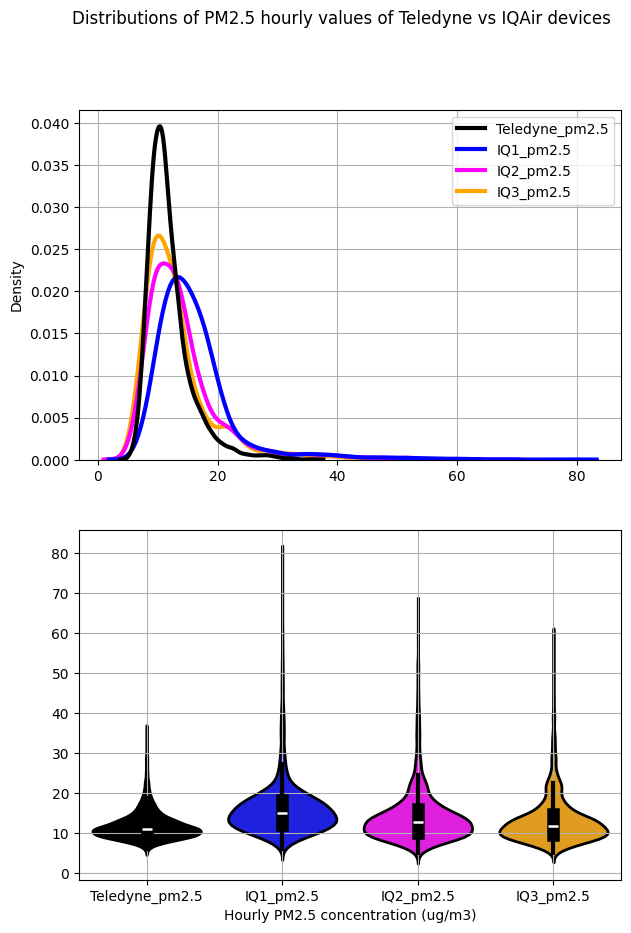

In [ ]:
# genera una figura con 2 subplots
#
fig, axes = plt.subplots(2, 1, figsize=(7, 10), sharex=False)
# Genera kdeplot
sb.kdeplot(ax=axes[0], data=PM25_15min, linewidth=3, palette={'Teledyne_pm2.5': 'black', 'IQ1_pm2.5':'blue', 'IQ2_pm2.5':'magenta', 'IQ3_pm2.5':'orange'}  )
axes[0].grid()
# genera boxplot
sb.violinplot(ax=axes[1], data=PM25_15min, linewidth=2, orient = "v", palette={'Teledyne_pm2.5': 'black', 'IQ1_pm2.5':'blue', 'IQ2_pm2.5':'magenta', 'IQ3_pm2.5':'orange'} )
fig.suptitle('Distributions of PM2.5 hourly values of Teledyne vs IQAir devices')
axes[1].grid()
plt.xlabel('Hourly PM2.5 concentration (ug/m3)')
plt.show()   #Figure BB#